# Predicting the Performance of CSTR using Machine Learning Algorithms.

### Data Analysis

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

#reading the CSTR operation data generated
df = pd.read_csv("combined_files.csv")
df.head()

,ethylene_in,benzene_in,ethylene_temp,ethylene_pres,benzene_temp,benzene_pres,reactor_temp,reactor_pres,reactor_volume,ethylene_out,benzene_out,ethylbenzene_out,diethylbenzene_out,res_time,conversion,yield
0,146.720325,142.081939,343.119700,39.573407,382.385275,16.047851,406.950797,20.390476,258.489453,23.552579,21.790994,117.414144,2.876801,44.173775,83.947296,80.025821
1,79.761171,87.012310,390.286754,43.972875,304.382421,18.332004,377.473155,26.757742,224.147713,19.160227,26.855682,59.712312,0.444316,66.053032,75.978002,74.863886
2,130.291538,59.432419,419.465346,49.112356,437.669690,24.637221,401.395466,38.474881,230.776326,67.987771,2.375962,51.809146,5.247311,59.267673,47.818737,39.764014
3,178.961231,69.362396,335.582612,39.366606,413.362034,43.318462,412.617143,43.768866,124.379630,107.884259,3.542665,60.562488,5.257243,22.733416,39.716408,33.841121
4,148.649473,192.679442,306.812503,31.359526,491.509726,37.101147,400.088948,40.232040,261.692332,18.564178,63.673407,127.926775,1.079260,36.325547,87.511440,86.059353


In [2]:
summary_stats = df.describe()
summary_stats

#To calculate descriptive statistics (mean, media, mode, standard deviation, minimumum, maximum, quartiles) for each
#feature to undertand the range and distribution of values

,ethylene_in,benzene_in,ethylene_temp,ethylene_pres,benzene_temp,benzene_pres,reactor_temp,reactor_pres,reactor_volume,ethylene_out,benzene_out,ethylbenzene_out,diethylbenzene_out,res_time,conversion,yield
count,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000
mean,132.354611,131.639725,399.067237,32.596511,399.732788,32.588218,399.719276,29.871739,173.677235,50.962824,53.096871,75.693964,2.848912,35.300135,66.836543,62.906839
std,66.677566,65.632364,58.143642,10.121184,57.598455,10.107977,28.567437,11.534436,72.228760,52.509664,53.360516,39.237431,5.066958,24.458939,23.794407,24.246589
min,10.145605,10.213749,300.039796,15.006102,300.011520,15.006006,350.001213,10.001488,50.006332,0.023511,0.018820,4.385390,0.000242,2.348268,1.897013,1.891751
25%,85.078866,84.623800,347.862192,23.687980,350.243917,23.888418,375.264479,19.895479,111.171248,10.941549,11.474449,49.684894,0.181842,19.005163,48.435630,43.187375
50%,128.313322,126.276762,398.976955,32.735409,399.899537,32.562861,399.737549,29.794220,173.693600,36.272234,37.613025,68.151980,0.697264,31.371470,69.629432,64.300487
75%,168.081526,167.503598,449.597097,41.433604,449.322524,41.363441,424.036073,39.885325,235.758831,76.308061,81.414981,95.606113,2.959598,45.101326,88.530308,85.029028
max,499.801837,499.294283,499.999106,49.996337,499.977621,49.998760,449.983942,49.990360,299.992077,468.524113,458.718548,380.393205,48.337369,492.314522,99.830914,99.530426


In [3]:
#to check if there is any missing values
missing_values = df.isnull().sum()
missing_values

ethylene_in           0
benzene_in            0
ethylene_temp         0
ethylene_pres         0
benzene_temp          0
benzene_pres          0
reactor_temp          0
reactor_pres          0
reactor_volume        0
ethylene_out          0
benzene_out           0
ethylbenzene_out      0
diethylbenzene_out    0
res_time              0
conversion            0
yield                 0
dtype: int64

In [4]:
# Check for duplicate rows
duplicate_rows = df[df.duplicated()]
duplicate_rows

,ethylene_in,benzene_in,ethylene_temp,ethylene_pres,benzene_temp,benzene_pres,reactor_temp,reactor_pres,reactor_volume,ethylene_out,benzene_out,ethylbenzene_out,diethylbenzene_out,res_time,conversion,yield


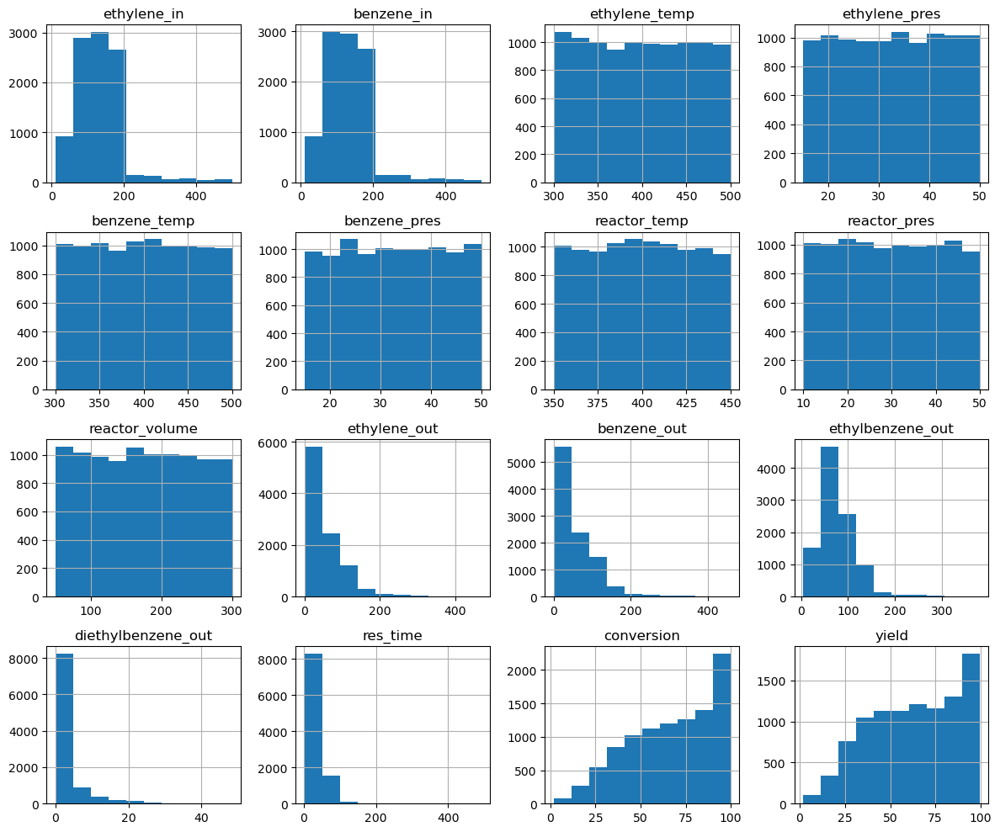

In [5]:
# Plot histograms for each feature
df.hist(figsize=(12, 10))
plt.tight_layout()
plt.show()

In [6]:
import plotly.express as px

# Create an interactive histogram with hover tooltips using Plotly Express
fig = px.histogram(df, x='ethylene_in', title='Distribution of Ethylene Input flow',
                   labels={'ethylene_in': 'Ethylene Input Flow'})
fig.update_traces(marker_color='blue', opacity=0.6)
fig.update_layout(hovermode='x unified')  # Enable hover mode for displaying tooltip on hover
fig.show()

In [7]:
import plotly.express as px

# Create an interactive histogram with hover tooltips using Plotly Express
fig = px.histogram(df, x='benzene_in', title='Distribution of Benzene Input flow',
                   labels={'benzene_in': 'Benzene Input Flow'})
fig.update_traces(marker_color='purple', opacity=0.6)
fig.update_layout(hovermode='x unified')  # Enable hover mode for displaying tooltip on hover
fig.show()

In [8]:
import plotly.express as px

# Create an interactive histogram with hover tooltips using Plotly Express
fig = px.histogram(df, x='res_time', title='Distribution of Residence time',
                   labels={'res_time': 'Residence Time'})
fig.update_traces(marker_color='blue', opacity=0.6)
fig.update_layout(hovermode='x unified')  # Enable hover mode for displaying tooltip on hover
fig.show()

In [9]:
import plotly.express as px

# Create an interactive histogram with hover tooltips using Plotly Express
fig = px.histogram(df, x='reactor_temp', title='Distribution of Reactor Temperature',
                   labels={'reactor_temp': 'Reactor Temperature'})
fig.update_traces(marker_color='blue', opacity=0.6)
fig.update_layout(hovermode='x unified')  # Enable hover mode for displaying tooltip on hover
fig.show()

In [10]:
import plotly.express as px

# Create an interactive histogram with hover tooltips using Plotly Express
fig = px.histogram(df, x='conversion', title='Distribution of Conversion',
                   labels={'conversion': 'Conversion'})
fig.update_traces(marker_color='blue', opacity=0.6)
fig.update_layout(hovermode='x unified')  # Enable hover mode for displaying tooltip on hover
fig.show()

In [11]:

import plotly.express as px
# Create an interactive histogram with hover tooltips using Plotly Express
fig = px.histogram(df, x='yield', title='Distribution of Yield',
                   labels={'yield': 'Yield'})
fig.update_traces(marker_color='red', opacity=0.6)
fig.update_layout(hovermode='x unified')  # Enable hover mode for displaying tooltip on hover
fig.show()

In [12]:
import plotly.express as px

# Interactive scatter plot
fig = px.scatter(df, x='ethylene_in', y='conversion', color='reactor_temp', hover_data=['benzene_in'])
fig.show()

In [13]:
# Plot for Residence Time vs Conversion
fig_conversion = px.scatter(df, x='res_time', y='conversion', 
                            title='Residence Time vs Conversion',
                            labels={'res_time': 'Residence Time (s)', 'conversion': 'Conversion (%)'},
                            hover_data=['res_time', 'conversion'])

# Display the plot
fig_conversion.show()

In [14]:
# Plot for Residence Time vs Yield
fig_yield = px.scatter(df, x='res_time', y='yield', 
                       title='Residence Time vs Yield',
                       labels={'res_time': 'Residence Time (s)', 'yield': 'Yield (%)'},
                       hover_data=['res_time', 'yield'])

# Display the plot
fig_yield.show()

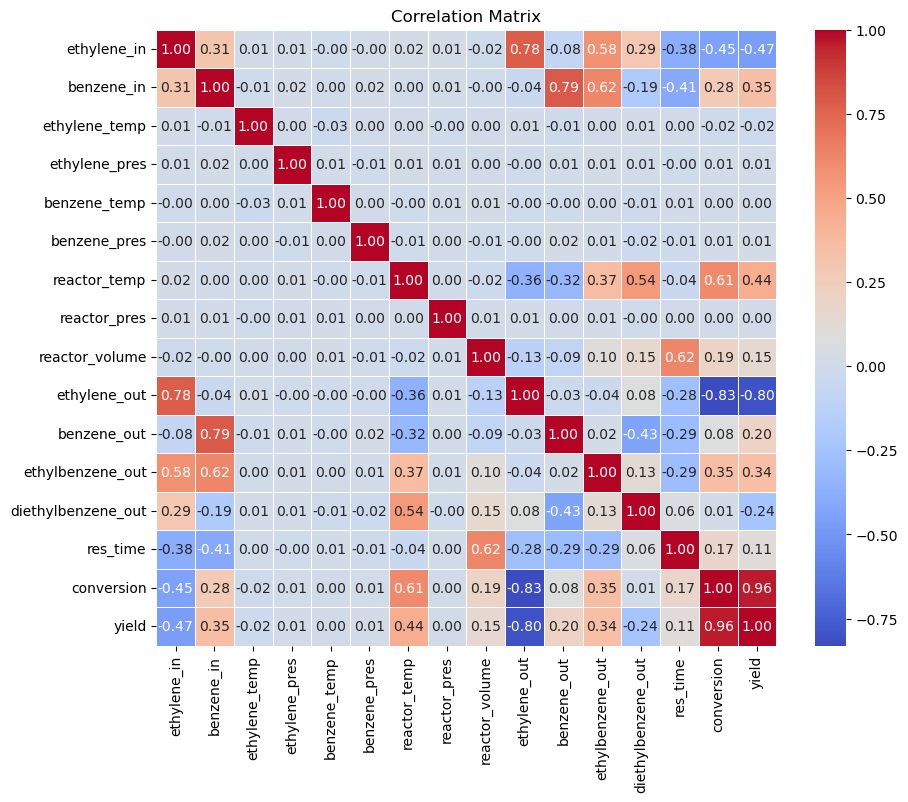

In [15]:
# Calculate correlation matrix
corr_matrix = df.corr()

# Plot heatmap of correlation matrix
import seaborn as sns
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Matrix')
plt.show()
#fig = px.imshow(corr_matrix, text_auto = True)
#fig.show()

In [16]:
# Selecting top features based on correlation with target variables
target_correlations = corr_matrix['ethylbenzene_out'].abs().sort_values(ascending=False)
top_features = target_correlations.index.tolist()[:10]  # Select top 10 features
top_features

['ethylbenzene_out',
 'benzene_in',
 'ethylene_in',
 'reactor_temp',
 'conversion',
 'yield',
 'res_time',
 'diethylbenzene_out',
 'reactor_volume',
 'ethylene_out']

In [17]:
# Calculate correlation matrix
corr_matrix = df.corr()

# Select top features based on correlation with target variable (e.g., 'conversion' or 'yield')
target_correlation = corr_matrix['conversion'].abs().sort_values(ascending=False)
top_features = target_correlation.index.tolist()[:10]  # Select top 10 features
df_selected = df[top_features]
df_selected

,conversion,yield,ethylene_out,reactor_temp,ethylene_in,ethylbenzene_out,benzene_in,reactor_volume,res_time,benzene_out
0,83.947296,80.025821,23.552579,406.950797,146.720325,117.414144,142.081939,258.489453,44.173775,21.790994
1,75.978002,74.863886,19.160227,377.473155,79.761171,59.712312,87.012310,224.147713,66.053032,26.855682
2,47.818737,39.764014,67.987771,401.395466,130.291538,51.809146,59.432419,230.776326,59.267673,2.375962
3,39.716408,33.841121,107.884259,412.617143,178.961231,60.562488,69.362396,124.379630,22.733416,3.542665
4,87.511440,86.059353,18.564178,400.088948,148.649473,127.926775,192.679442,261.692332,36.325547,63.673407
...,...,...,...,...,...,...,...,...,...,...
9995,78.488027,78.328554,15.179949,382.365786,70.565121,55.272639,245.358234,141.256825,18.370636,190.029328
9996,43.085790,41.675786,240.957497,398.806027,423.369659,176.442634,223.082975,159.749713,11.613154,43.655578
9997,17.240121,17.218093,283.387234,358.755688,342.421033,58.958372,307.704034,97.566596,6.662900,248.707949
9998,15.064112,15.053122,187.848198,355.061994,221.164694,33.292190,268.786176,66.452946,5.904251,235.481832


In [18]:
# Pairwise scatter plot matrix
#sns.pairplot(df[['ethylene_in', 'benzene_in', 'reactor_temp', 'conversion']], diag_kind='kde')
#plt.show()

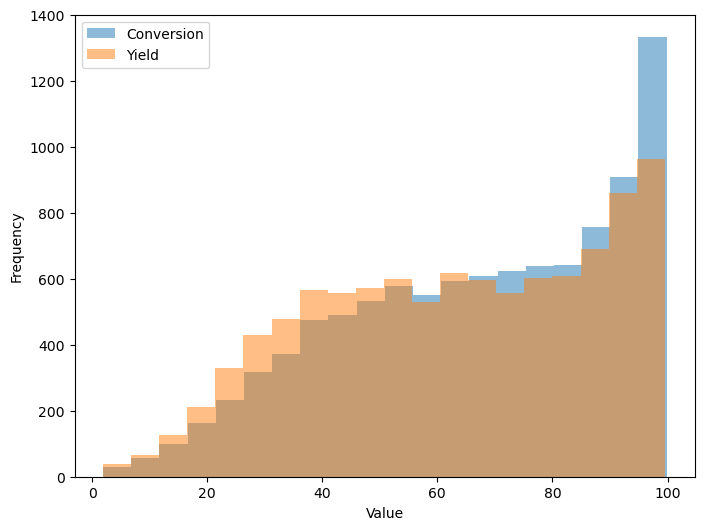

In [19]:
# Histograms of target variables
plt.figure(figsize=(8, 6))
plt.hist(df['conversion'], bins=20, alpha=0.5, label='Conversion')
plt.hist(df['yield'], bins=20, alpha=0.5, label='Yield')
plt.xlabel('Value')
plt.ylabel('Frequency')
plt.legend()
plt.show()

## Building the Machine Learning Models

In [20]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.multioutput import MultiOutputRegressor
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt
import seaborn as sns

 #### Features: Ethylene and Benzene input flow, Ethylene and Benzene Temperatures, Reactor Temperature and Volume

In [21]:
# Assuming df is your DataFrame
# Replace 'your_data.csv' with your actual data file
df = pd.read_csv('combined_files.csv')

# Select relevant features and target variables
features = ['ethylene_in', 'benzene_in', 'ethylene_temp', 'benzene_temp', 'reactor_temp', 'reactor_volume']
targets = ['conversion', 'yield']

X = df[features]
y = df[targets]

# Check for missing values and handle them if necessary
# Here we simply drop rows with missing values
df.dropna(inplace=True)

In [22]:
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

### Linear Regression

In [23]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
import joblib
import matplotlib.pyplot as plt

In [24]:
# Initialize the Linear Regression model
model = LinearRegression()

# Train the model on the training data
model.fit(X_train, y_train)

LinearRegression()

In [25]:
# Make predictions on the test set
y_pred = model.predict(X_test)

# Evaluate the model's performance
mse_conversion = mean_squared_error(y_test['conversion'], y_pred[:, 0])
mse_yield = mean_squared_error(y_test['yield'], y_pred[:, 1])

r2_conversion = r2_score(y_test['conversion'], y_pred[:, 0])
r2_yield = r2_score(y_test['yield'], y_pred[:, 1])

print(f'Mean Squared Error for Conversion: {mse_conversion}')
print(f'Mean Squared Error for Yield: {mse_yield}')
print(f'R² Score for Conversion: {r2_conversion}')
print(f'R² Score for Yield: {r2_yield}')

Mean Squared Error for Conversion: 114.44643261577032
Mean Squared Error for Yield: 170.42283198251016
R² Score for Conversion: 0.794748797719613
R² Score for Yield: 0.7045534818914103


In [26]:
# Save the trained model for later use
joblib.dump(model, 'linear_regression_model.pkl')

['linear_regression_model.pkl']

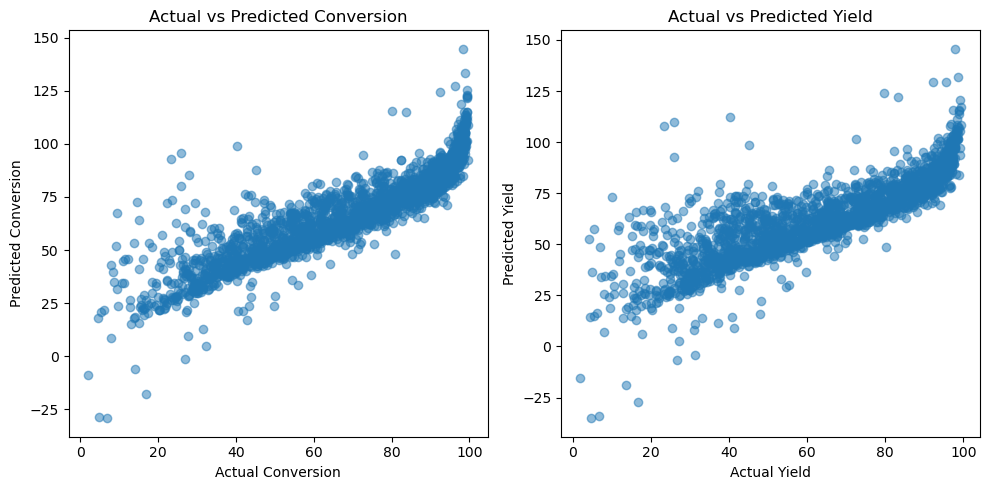

In [27]:
# Plotting actual vs predicted for conversion
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.scatter(y_test['conversion'], y_pred[:, 0], alpha=0.5)
plt.xlabel('Actual Conversion')
plt.ylabel('Predicted Conversion')
plt.title('Actual vs Predicted Conversion')

# Plotting actual vs predicted for yield
plt.subplot(1, 2, 2)
plt.scatter(y_test['yield'], y_pred[:, 1], alpha=0.5)
plt.xlabel('Actual Yield')
plt.ylabel('Predicted Yield')
plt.title('Actual vs Predicted Yield')

plt.tight_layout()
plt.show()

### Random Forest Regressor

In [71]:
# Define the multi-output regressor
regr = MultiOutputRegressor(RandomForestRegressor(n_estimators=100, random_state=42))

# Train the model
regr.fit(X_train, y_train)

MultiOutputRegressor(estimator=RandomForestRegressor(random_state=42))

In [29]:
# Make predictions
y_pred = regr.predict(X_test)

# Evaluate the model
mse_conversion = mean_squared_error(y_test['conversion'], y_pred[:, 0])
mse_yield = mean_squared_error(y_test['yield'], y_pred[:, 1])

r2_conversion = r2_score(y_test['conversion'], y_pred[:, 0])
r2_yield = r2_score(y_test['yield'], y_pred[:, 1])

print(f'Mean Squared Error for Conversion: {mse_conversion}')
print(f'Mean Squared Error for Yield: {mse_yield}')
print(f'R² Score for Conversion: {r2_conversion}')
print(f'R² Score for Yield: {r2_yield}')

Mean Squared Error for Conversion: 7.66460186465536
Mean Squared Error for Yield: 7.1321786693547295
R² Score for Conversion: 0.9862541041099762
R² Score for Yield: 0.9876355924269263


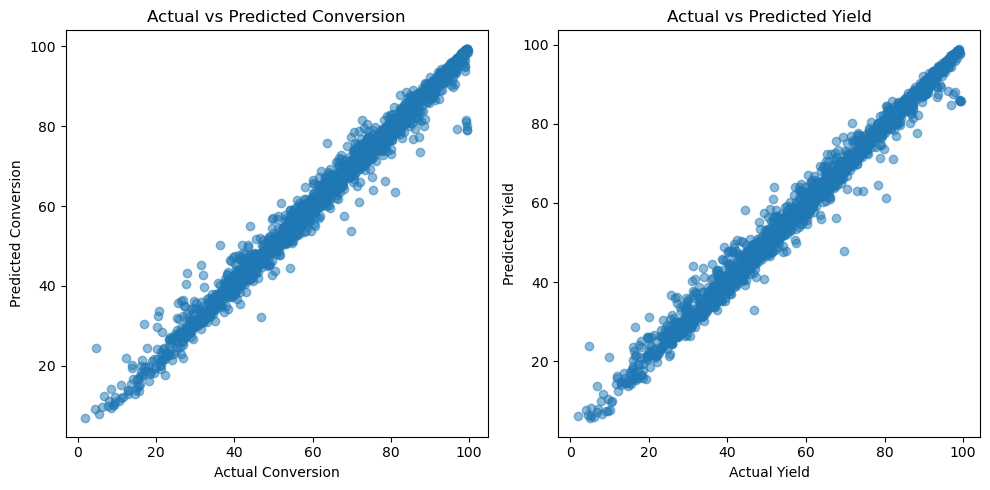

In [30]:
# Plotting actual vs predicted for conversion
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.scatter(y_test['conversion'], y_pred[:, 0], alpha=0.5)
plt.xlabel('Actual Conversion')
plt.ylabel('Predicted Conversion')
plt.title('Actual vs Predicted Conversion')

# Plotting actual vs predicted for yield
plt.subplot(1, 2, 2)
plt.scatter(y_test['yield'], y_pred[:, 1], alpha=0.5)
plt.xlabel('Actual Yield')
plt.ylabel('Predicted Yield')
plt.title('Actual vs Predicted Yield')

plt.tight_layout()
plt.show()

In [31]:
import joblib

# Save the trained model to a file
joblib.dump(regr, 'multi_output_regressor1.pkl')

['multi_output_regressor1.pkl']

### Making predictions using built Random Forest and doing actual and predicted comparison

In [32]:
import pandas as pd
import joblib
import numpy as np

# Load the trained model
model = joblib.load('multi_output_regressor1.pkl')

validation_data = pd.read_csv('validation_data.csv')

# Select only the features required for the model 
features = ['ethylene_in', 'benzene_in', 'ethylene_temp', 'benzene_temp', 'reactor_temp', 'reactor_volume']

X_new = validation_data[features]

# Make predictions
predictions = model.predict(X_new)

# Create a DataFrame to store predictions alongside the input data
predictions_df = validation_data.copy()
predictions_df['predicted_conversion'] = predictions[:, 0]
predictions_df['predicted_yield'] = predictions[:, 1]

# Output the predictions
print(predictions_df)

# Optionally, save the predictions to a new CSV file
predictions_df.to_csv('predicted_results.csv', index=False)


    ethylene_in  benzene_in  ethylene_temp  ethylene_pres  benzene_temp  \
0    209.313091  123.974188     432.891707      49.450215    356.984311   
1    154.920410  375.142587     305.826810      47.758319    307.282543   
2    383.696997  393.917093     438.509811      38.132210    361.652885   
3    232.349326  327.634248     438.224028      21.866493    341.169813   
4    359.896282  136.160392     352.745431      19.318662    435.923506   
..          ...         ...            ...            ...           ...   
95   360.785527   85.917475     328.821733      15.797847    407.085047   
96   100.295856  209.179623     354.706863      23.780946    350.983682   
97   279.408307  158.489245     345.858369      28.071354    395.511931   
98   341.629936  160.887174     459.937693      47.674901    320.210859   
99   105.054893   56.930660     449.197939      42.036786    355.688445   

    benzene_pres  reactor_temp  reactor_pres  reactor_volume  ethylene_out  \
0      44.795459    3

In [33]:
p = pd.read_csv("predicted_results.csv")
p.head(20)

,ethylene_in,benzene_in,ethylene_temp,ethylene_pres,benzene_temp,benzene_pres,reactor_temp,reactor_pres,reactor_volume,ethylene_out,benzene_out,ethylbenzene_out,diethylbenzene_out,res_time,conversion,yield,predicted_conversion,predicted_yield
0,209.313091,123.974188,432.891707,49.450215,356.984311,44.795459,379.800912,44.544188,141.260061,120.412959,35.807134,87.433976,0.733078,20.457931,42.472323,41.771862,45.113172,48.657125
1,154.920410,375.142587,305.826810,47.758319,307.282543,16.060875,360.845351,49.714986,58.820787,123.126171,343.356476,31.777982,0.008129,4.575788,20.522951,20.512457,22.215490,22.979659
2,383.696997,393.917093,438.509811,38.132210,361.652885,43.623407,404.588385,16.525729,295.184387,90.664892,104.334801,286.132479,3.449813,18.140803,76.370706,74.572509,71.722312,66.460643
3,232.349326,327.634248,438.224028,21.866493,341.169813,48.166255,440.437868,24.751593,114.906643,16.841136,114.437527,210.885252,2.311469,9.094404,92.751803,90.762153,91.714272,88.858385
4,359.896282,136.160392,352.745431,19.318662,435.923506,47.553076,373.912590,19.937432,83.499870,294.461089,70.916626,65.052339,0.191427,7.342121,18.181681,18.075302,28.208744,30.842322
5,163.571422,126.196520,427.288107,35.819403,318.395964,33.728386,408.627611,43.820292,241.119912,43.285897,11.067476,109.972562,5.156482,41.376282,73.537005,67.232137,71.784442,65.603867
6,89.003311,80.343910,301.295621,37.846179,436.889264,49.972701,397.176122,37.823332,132.541921,21.883798,14.422926,64.722456,1.198528,38.681546,75.412378,72.719156,76.582664,74.241880
7,367.592314,107.579812,364.400416,28.254739,369.295258,28.858813,369.312163,49.130574,269.180684,289.588280,30.175021,76.805548,0.599243,25.598675,21.220257,20.894220,28.369440,28.311035
8,276.891706,360.781226,493.232291,35.559428,371.611590,29.853870,416.498404,15.849690,110.197596,55.727446,141.253666,217.890860,1.636700,7.817536,79.873920,78.691725,80.021760,81.650626
9,171.740637,342.682964,477.830911,19.781141,371.195102,39.641429,353.788720,27.332670,229.805871,107.408717,278.388763,64.256482,0.037719,19.377713,37.458764,37.414839,36.115701,36.331231


### Gradient Boosting Regressor

In [34]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.multioutput import MultiOutputRegressor
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt
import seaborn as sns
import joblib

In [35]:
# Load your dataset
# Replace 'your_data.csv' with your actual data file
df = pd.read_csv('combined_files.csv')

# Select relevant features and target variables
features = ['ethylene_in', 'benzene_in', 'ethylene_temp', 'benzene_temp', 'reactor_temp', 'reactor_volume']
targets = ['conversion', 'yield']

X = df[features]
y = df[targets]

# Check for missing values and handle them if necessary
df.dropna(inplace=True)

In [36]:
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [37]:
# Define the multi-output regressor using Gradient Boosting Regressor
regr = MultiOutputRegressor(GradientBoostingRegressor(n_estimators=100, random_state=42))

# Train the model
regr.fit(X_train, y_train)

MultiOutputRegressor(estimator=GradientBoostingRegressor(random_state=42))

In [38]:
# Make predictions
y_pred = regr.predict(X_test)

# Evaluate the model
mse_conversion = mean_squared_error(y_test['conversion'], y_pred[:, 0])
mse_yield = mean_squared_error(y_test['yield'], y_pred[:, 1])

r2_conversion = r2_score(y_test['conversion'], y_pred[:, 0])
r2_yield = r2_score(y_test['yield'], y_pred[:, 1])

print(f'Mean Squared Error for Conversion: {mse_conversion}')
print(f'Mean Squared Error for Yield: {mse_yield}')
print(f'R² Score for Conversion: {r2_conversion}')
print(f'R² Score for Yield: {r2_yield}')

Mean Squared Error for Conversion: 9.30472047256089
Mean Squared Error for Yield: 11.729934193835943
R² Score for Conversion: 0.9833126728354407
R² Score for Yield: 0.9796648830740744


In [39]:
# Save the trained model to a file
joblib.dump(regr, 'multi_output_gb_regressor2.pkl')

['multi_output_gb_regressor2.pkl']

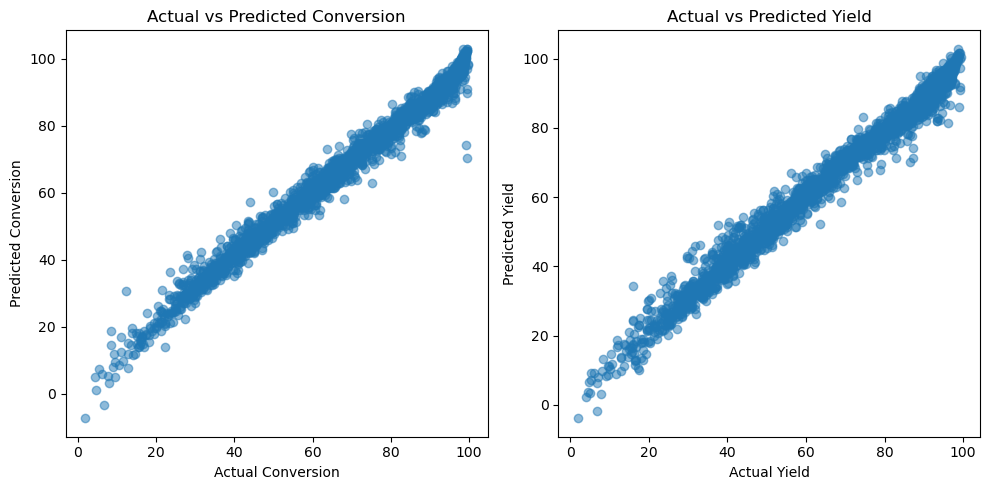

In [40]:
# Plotting actual vs predicted for conversion
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.scatter(y_test['conversion'], y_pred[:, 0], alpha=0.5)
plt.xlabel('Actual Conversion')
plt.ylabel('Predicted Conversion')
plt.title('Actual vs Predicted Conversion')

# Plotting actual vs predicted for yield
plt.subplot(1, 2, 2)
plt.scatter(y_test['yield'], y_pred[:, 1], alpha=0.5)
plt.xlabel('Actual Yield')
plt.ylabel('Predicted Yield')
plt.title('Actual vs Predicted Yield')

plt.tight_layout()
plt.show()

### Support Vector Machine

In [41]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.svm import SVR
from sklearn.multioutput import MultiOutputRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt
import seaborn as sns
import joblib
# Load your dataset
df = pd.read_csv('combined_files.csv')

# Select relevant features and target variables
features = ['ethylene_in', 'benzene_in', 'ethylene_temp', 'benzene_temp', 'reactor_temp', 'reactor_volume']
targets = ['conversion', 'yield']

X = df[features]
y = df[targets]

# Check for missing values and handle them if necessary
df.dropna(inplace=True)

In [42]:
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define the multi-output regressor using SVR
regr = MultiOutputRegressor(SVR(kernel='rbf', C=1.0, epsilon=0.2))

# Train the model
regr.fit(X_train, y_train)

MultiOutputRegressor(estimator=SVR(epsilon=0.2))

In [43]:
# Make predictions
y_pred = regr.predict(X_test)

# Evaluate the model
mse_conversion = mean_squared_error(y_test['conversion'], y_pred[:, 0])
mse_yield = mean_squared_error(y_test['yield'], y_pred[:, 1])

r2_conversion = r2_score(y_test['conversion'], y_pred[:, 0])
r2_yield = r2_score(y_test['yield'], y_pred[:, 1])

print(f'Mean Squared Error for Conversion: {mse_conversion}')
print(f'Mean Squared Error for Yield: {mse_yield}')
print(f'R² Score for Conversion: {r2_conversion}')
print(f'R² Score for Yield: {r2_yield}')

Mean Squared Error for Conversion: 61.86650225259368
Mean Squared Error for Yield: 100.56981915953953
R² Score for Conversion: 0.8890470093475211
R² Score for Yield: 0.825651278341943


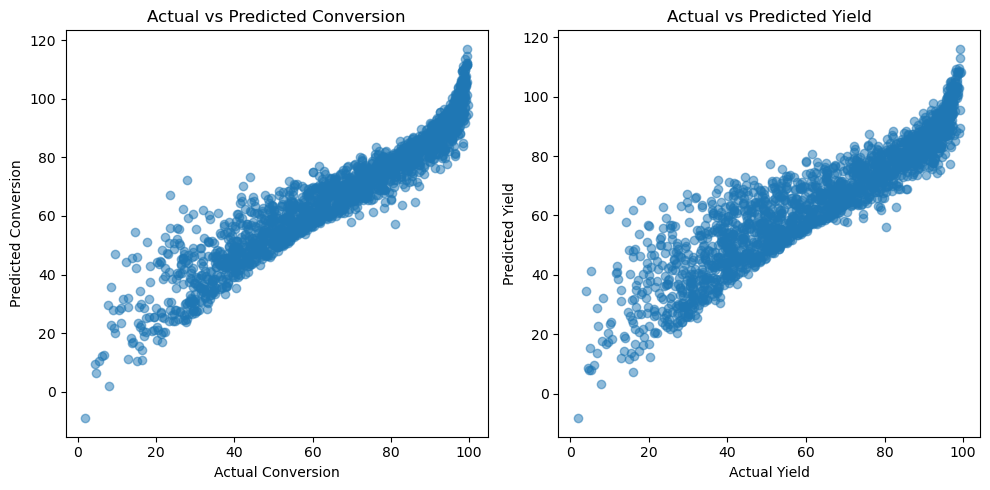

In [44]:
# Plotting actual vs predicted for conversion
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.scatter(y_test['conversion'], y_pred[:, 0], alpha=0.5)
plt.xlabel('Actual Conversion')
plt.ylabel('Predicted Conversion')
plt.title('Actual vs Predicted Conversion')

# Plotting actual vs predicted for yield
plt.subplot(1, 2, 2)
plt.scatter(y_test['yield'], y_pred[:, 1], alpha=0.5)
plt.xlabel('Actual Yield')
plt.ylabel('Predicted Yield')
plt.title('Actual vs Predicted Yield')

plt.tight_layout()
plt.show()

### Artificial Neural Network (ANN)

In [45]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import load_model
import matplotlib.pyplot as plt
import seaborn as sns

In [46]:
# Load your dataset
df = pd.read_csv('combined_files.csv')

# Select relevant features and target variables
features = ['ethylene_in', 'benzene_in', 'ethylene_temp', 'benzene_temp', 'reactor_temp', 'reactor_volume']
targets = ['conversion', 'yield']

X = df[features]
y = df[targets]

# Check for missing values and handle them if necessary
df.dropna(inplace=True)
# Standardize the features
scaler = StandardScaler()
X = scaler.fit_transform(X)

In [47]:
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [48]:
# Define the ANN model
model = Sequential()
model.add(Dense(64, input_dim=X_train.shape[1], activation='relu'))
model.add(Dense(32, activation='relu'))
model.add(Dense(16, activation='relu'))
model.add(Dense(2, activation='linear'))  # Output layer with 2 outputs (conversion and yield)

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.001), loss='mse')

# Train the model
history = model.fit(X_train, y_train, epochs=100, batch_size=32, validation_split=0.2, verbose=1)

C:\Users\HP\anaconda3\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



Epoch 1/100
200/200 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 3625.5154 - val_loss: 282.4714
Epoch 2/100
200/200 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 268.7167 - val_loss: 226.5461
Epoch 3/100
200/200 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 221.8212 - val_loss: 180.0922
Epoch 4/100
200/200 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 166.5831 - val_loss: 125.4689
Epoch 5/100
200/200 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 111.9585 - val_loss: 64.6589
Epoch 6/100
200/200 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 57.8565 - val_loss: 39.1376
Epoch 7/100
200/200 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 35.5808 - val_loss: 28.4673
Epoch 8/100
200/200 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 30.7143 - val_loss: 22.5328
Epoch 9/100
200/200 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 25.2010 - val_loss: 18.7995
Epoch 10/100
200/200 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 19.5006 - val_loss: 16.1976
Epoch 11/100
200/200 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 16.4181 - val_loss: 13.9291
Epoch 12/

In [49]:
from sklearn.metrics import mean_squared_error, r2_score
# Make predictions
y_pred = model.predict(X_test)

# Evaluate the model
mse_conversion = mean_squared_error(y_test['conversion'], y_pred[:, 0])
mse_yield = mean_squared_error(y_test['yield'], y_pred[:, 1])

r2_conversion = r2_score(y_test['conversion'], y_pred[:, 0])
r2_yield = r2_score(y_test['yield'], y_pred[:, 1])

print(f'Mean Squared Error for Conversion: {mse_conversion}')
print(f'Mean Squared Error for Yield: {mse_yield}')
print(f'R² Score for Conversion: {r2_conversion}')
print(f'R² Score for Yield: {r2_yield}')

63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
Mean Squared Error for Conversion: 1.1208479948001453
Mean Squared Error for Yield: 1.3735994780721266
R² Score for Conversion: 0.997989842118726
R² Score for Yield: 0.9976187158824246


In [50]:
model.save('ann_model.h5')

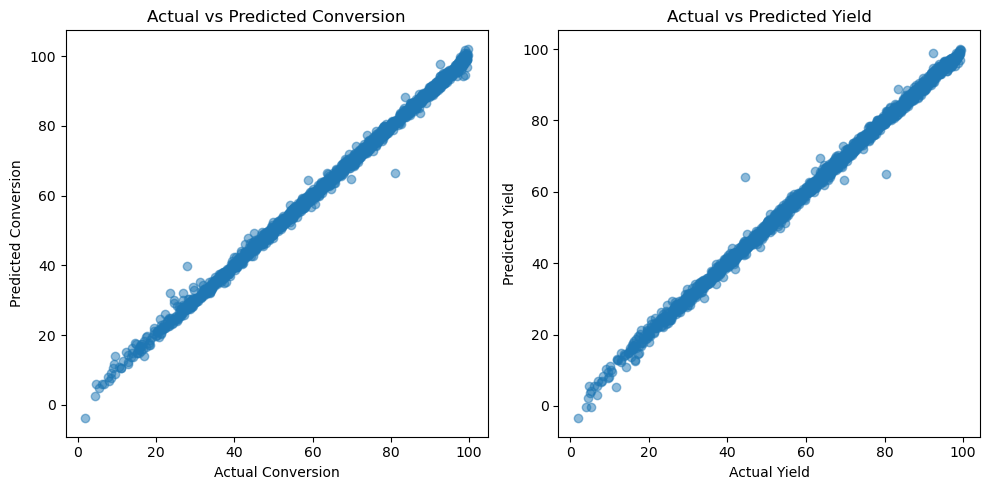

In [51]:
# Plotting actual vs predicted for conversion
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.scatter(y_test['conversion'], y_pred[:, 0], alpha=0.5)
plt.xlabel('Actual Conversion')
plt.ylabel('Predicted Conversion')
plt.title('Actual vs Predicted Conversion')

# Plotting actual vs predicted for yield
plt.subplot(1, 2, 2)
plt.scatter(y_test['yield'], y_pred[:, 1], alpha=0.5)
plt.xlabel('Actual Yield')
plt.ylabel('Predicted Yield')
plt.title('Actual vs Predicted Yield')

plt.tight_layout()
plt.show()

### Making predictions using built ANN model and doing actual and predicted comparison

In [52]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.models import load_model
from tensorflow.keras.optimizers import Adam
import matplotlib.pyplot as plt
import joblib

In [53]:
# Load the trained model
model = load_model('ann_model.h5', compile=False)

# Recompile the model with the correct loss and optimizer
model.compile(optimizer=Adam(learning_rate=0.001), loss='mse')

In [54]:
# Load new data for validation (replace 'new_data.csv' with your actual file)
validation_data = pd.read_csv('validation_data.csv')

# Select relevant features
features = ['ethylene_in', 'benzene_in', 'ethylene_temp', 'benzene_temp', 'reactor_temp', 'reactor_volume']
X_new = validation_data[features]

# Standardize the new data using the same scaler used during training
# If you have saved the scaler, load and use it. If not, fit a new scaler (not recommended for production use)
#scaler = joblib.load('scaler.pkl')  # Uncomment if you have saved your scaler
X_new = scaler.transform(X_new)

In [55]:
# Make predictions on the new data
predictions = model.predict(X_new)

# Create a DataFrame with the results
results = pd.DataFrame(predictions, columns=['Predicted Conversion', 'Predicted Yield'])

# Concatenate the predictions with the original new data
final_results = pd.concat([validation_data, results], axis=1)

# Display the results
print(final_results)

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
    ethylene_in  benzene_in  ethylene_temp  ethylene_pres  benzene_temp  \
0    209.313091  123.974188     432.891707      49.450215    356.984311   
1    154.920410  375.142587     305.826810      47.758319    307.282543   
2    383.696997  393.917093     438.509811      38.132210    361.652885   
3    232.349326  327.634248     438.224028      21.866493    341.169813   
4    359.896282  136.160392     352.745431      19.318662    435.923506   
..          ...         ...            ...            ...           ...   
95   360.785527   85.917475     328.821733      15.797847    407.085047   
96   100.295856  209.179623     354.706863      23.780946    350.983682   
97   279.408307  158.489245     345.858369      28.071354    395.511931   
98   341.629936  160.887174     459.937693      47.674901    320.210859   
99   105.054893   56.930660     449.197939      42.036786    355.688445   

    benzene_pres  reactor_temp  reactor_pres  reactor_volume 

In [56]:
final_results.to_csv('predicted_results(ann).csv', index=False)

In [57]:
df = pd.read_csv("predicted_results(ann).csv")
df.head(20)

,ethylene_in,benzene_in,ethylene_temp,ethylene_pres,benzene_temp,benzene_pres,reactor_temp,reactor_pres,reactor_volume,ethylene_out,benzene_out,ethylbenzene_out,diethylbenzene_out,res_time,conversion,yield,Predicted Conversion,Predicted Yield
0,209.313091,123.974188,432.891707,49.450215,356.984311,44.795459,379.800912,44.544188,141.260061,120.412959,35.807134,87.433976,0.733078,20.457931,42.472323,41.771862,42.488950,41.693207
1,154.920410,375.142587,305.826810,47.758319,307.282543,16.060875,360.845351,49.714986,58.820787,123.126171,343.356476,31.777982,0.008129,4.575788,20.522951,20.512457,20.308056,20.922596
2,383.696997,393.917093,438.509811,38.132210,361.652885,43.623407,404.588385,16.525729,295.184387,90.664892,104.334801,286.132479,3.449813,18.140803,76.370706,74.572509,73.756165,72.391410
3,232.349326,327.634248,438.224028,21.866493,341.169813,48.166255,440.437868,24.751593,114.906643,16.841136,114.437527,210.885252,2.311469,9.094404,92.751803,90.762153,92.604164,90.445160
4,359.896282,136.160392,352.745431,19.318662,435.923506,47.553076,373.912590,19.937432,83.499870,294.461089,70.916626,65.052339,0.191427,7.342121,18.181681,18.075302,16.604567,16.118763
5,163.571422,126.196520,427.288107,35.819403,318.395964,33.728386,408.627611,43.820292,241.119912,43.285897,11.067476,109.972562,5.156482,41.376282,73.537005,67.232137,73.141140,67.915504
6,89.003311,80.343910,301.295621,37.846179,436.889264,49.972701,397.176122,37.823332,132.541921,21.883798,14.422926,64.722456,1.198528,38.681546,75.412378,72.719156,74.156710,71.955370
7,367.592314,107.579812,364.400416,28.254739,369.295258,28.858813,369.312163,49.130574,269.180684,289.588280,30.175021,76.805548,0.599243,25.598675,21.220257,20.894220,19.626219,18.060804
8,276.891706,360.781226,493.232291,35.559428,371.611590,29.853870,416.498404,15.849690,110.197596,55.727446,141.253666,217.890860,1.636700,7.817536,79.873920,78.691725,79.267410,78.639080
9,171.740637,342.682964,477.830911,19.781141,371.195102,39.641429,353.788720,27.332670,229.805871,107.408717,278.388763,64.256482,0.037719,19.377713,37.458764,37.414839,38.814426,38.358990


### K-Nearest Neighbours (KNN) Regressor

In [58]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt
import seaborn as sns
import joblib

In [59]:
# Load your dataset
df = pd.read_csv('combined_files.csv')

# Select relevant features and target variables
features = ['ethylene_in', 'benzene_in', 'ethylene_temp', 'benzene_temp', 'reactor_temp', 'reactor_volume']
targets = ['conversion', 'yield']

X = df[features]
y = df[targets]

# Check for missing values and handle them if necessary
df.dropna(inplace=True)

# Standardize the features
scaler = StandardScaler()
X = scaler.fit_transform(X)

# Save the scaler for later use
joblib.dump(scaler, 'scaler.pkl')

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [60]:
# Initialize the KNN Regressor with a specified number of neighbors
knn = KNeighborsRegressor(n_neighbors=5)  # You can adjust the number of neighbors

# Train the model
knn.fit(X_train, y_train)

KNeighborsRegressor()

In [61]:
# Make predictions on the test set
y_pred = knn.predict(X_test)

# Evaluate the model's performance
mse_conversion = mean_squared_error(y_test['conversion'], y_pred[:, 0])
mse_yield = mean_squared_error(y_test['yield'], y_pred[:, 1])

r2_conversion = r2_score(y_test['conversion'], y_pred[:, 0])
r2_yield = r2_score(y_test['yield'], y_pred[:, 1])

print(f'Mean Squared Error for Conversion: {mse_conversion}')
print(f'Mean Squared Error for Yield: {mse_yield}')
print(f'R² Score for Conversion: {r2_conversion}')
print(f'R² Score for Yield: {r2_yield}')

Mean Squared Error for Conversion: 42.78519784190422
Mean Squared Error for Yield: 48.347257396881496
R² Score for Conversion: 0.9232679158612326
R² Score for Yield: 0.9161847700108967


In [62]:
# Save the trained model for later use
joblib.dump(knn, 'knn_model.pkl')

['knn_model.pkl']

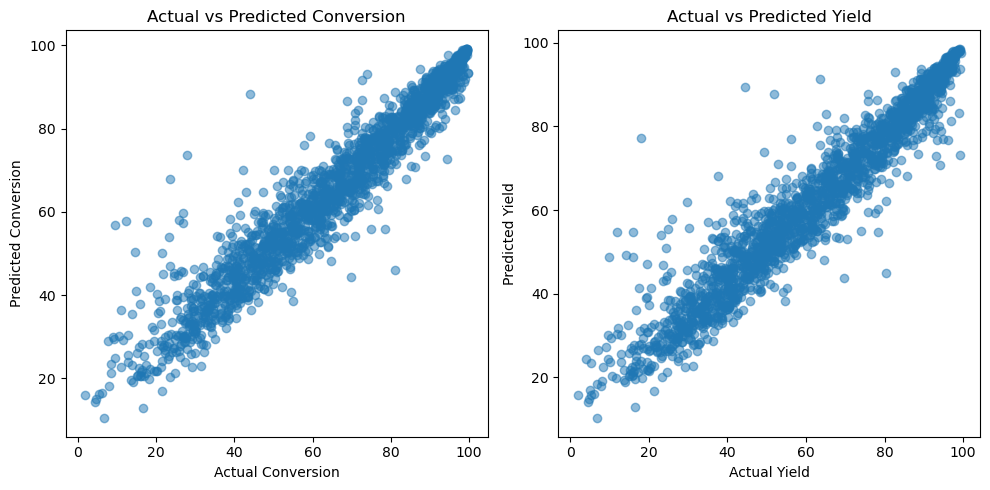

In [63]:
# Plotting actual vs predicted for conversion
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.scatter(y_test['conversion'], y_pred[:, 0], alpha=0.5)
plt.xlabel('Actual Conversion')
plt.ylabel('Predicted Conversion')
plt.title('Actual vs Predicted Conversion')

# Plotting actual vs predicted for yield
plt.subplot(1, 2, 2)
plt.scatter(y_test['yield'], y_pred[:, 1], alpha=0.5)
plt.xlabel('Actual Yield')
plt.ylabel('Predicted Yield')
plt.title('Actual vs Predicted Yield')

plt.tight_layout()
plt.show()

### Decision Tree Regressor

In [64]:
from sklearn.tree import DecisionTreeRegressor

In [65]:
# Initialize the Decision Tree Regressor model
model = DecisionTreeRegressor(random_state=42)

# Train the model on the training data
model.fit(X_train, y_train)

DecisionTreeRegressor(random_state=42)

In [66]:
# Make predictions on the test set
y_pred = model.predict(X_test)

# Evaluate the model's performance
mse_conversion = mean_squared_error(y_test['conversion'], y_pred[:, 0])
mse_yield = mean_squared_error(y_test['yield'], y_pred[:, 1])

r2_conversion = r2_score(y_test['conversion'], y_pred[:, 0])
r2_yield = r2_score(y_test['yield'], y_pred[:, 1])

print(f'Mean Squared Error for Conversion: {mse_conversion}')
print(f'Mean Squared Error for Yield: {mse_yield}')
print(f'R² Score for Conversion: {r2_conversion}')
print(f'R² Score for Yield: {r2_yield}')

Mean Squared Error for Conversion: 28.666633566565775
Mean Squared Error for Yield: 27.149078891518467
R² Score for Conversion: 0.9485885154269269
R² Score for Yield: 0.9529341184215404


In [67]:
# Save the trained model for later use
joblib.dump(model, 'decision_tree_model.pkl')

['decision_tree_model.pkl']

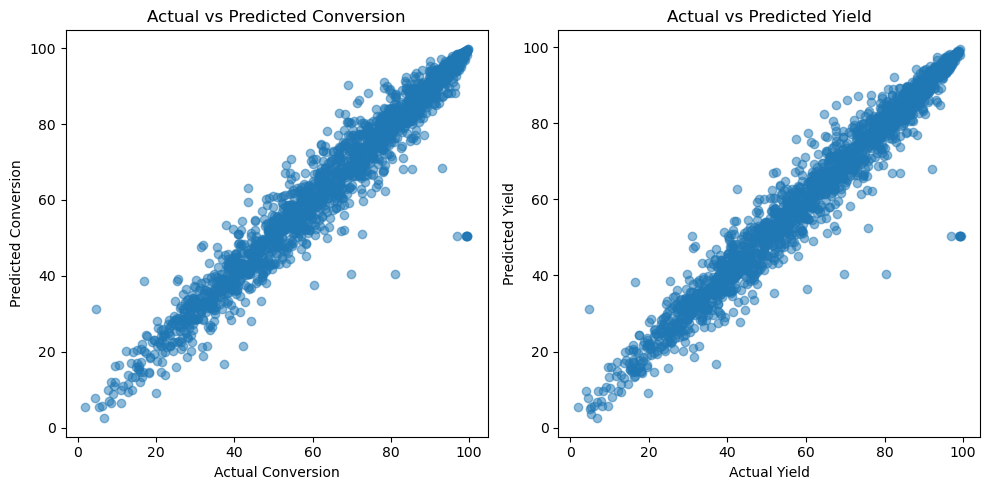

In [68]:
# Plotting actual vs predicted for conversion
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.scatter(y_test['conversion'], y_pred[:, 0], alpha=0.5)
plt.xlabel('Actual Conversion')
plt.ylabel('Predicted Conversion')
plt.title('Actual vs Predicted Conversion')

# Plotting actual vs predicted for yield
plt.subplot(1, 2, 2)
plt.scatter(y_test['yield'], y_pred[:, 1], alpha=0.5)
plt.xlabel('Actual Yield')
plt.ylabel('Predicted Yield')
plt.title('Actual vs Predicted Yield')

plt.tight_layout()
plt.show()

                         Model     MSE  R-Squared
0            Linear Regression  114.45       0.80
1                KNN Regressor   42.78       0.92
2      Decision Tree Regressor   28.67       0.95
3     Support Vector Regressor   61.87       0.89
4      Random Forest Regressor    7.66       0.99
5  Gradient Boosting Regressor    9.30       0.98


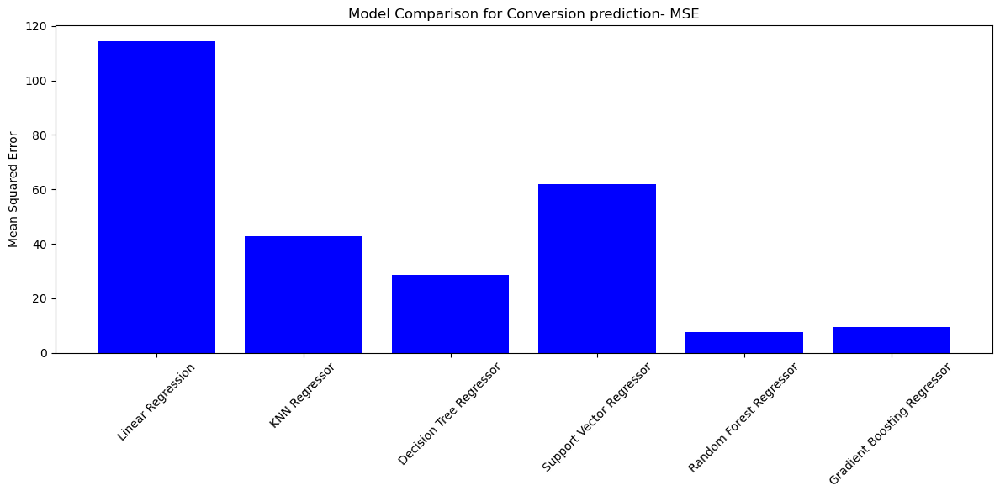

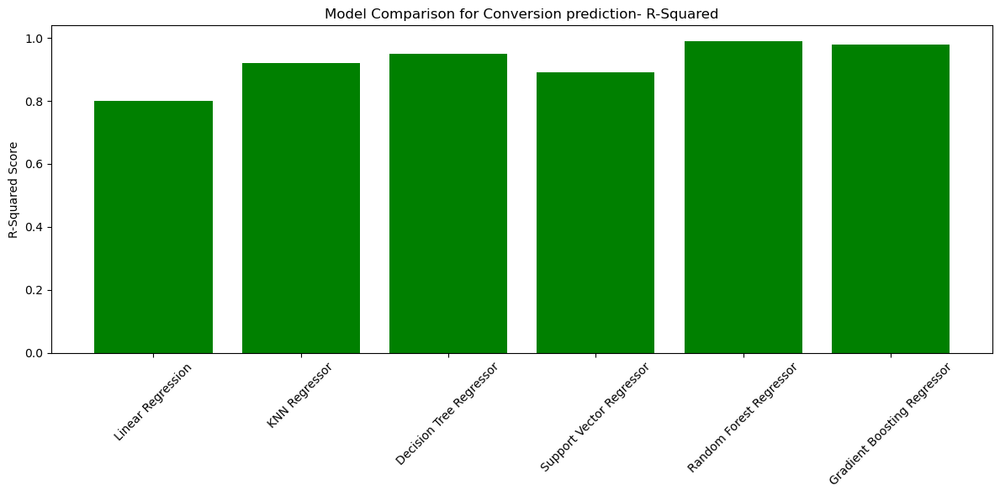

In [69]:
import pandas as pd
import matplotlib.pyplot as plt

# Example precomputed performance metrics
# Replace these with your actual scores
model_names = [
    'Linear Regression',
    'KNN Regressor',
    'Decision Tree Regressor',
    'Support Vector Regressor',
    'Random Forest Regressor',
    'Gradient Boosting Regressor'
]

# Precomputed MSE and R-Squared scores
mse_scores = [114.45, 42.78, 28.67, 61.87, 7.66, 9.30]  # Replace with your actual MSE values
r2_scores = [0.8, 0.92, 0.95, 0.89, 0.99, 0.98]   # Replace with your actual R² values

# Create a DataFrame to hold the performance data
performance_df = pd.DataFrame({
    'Model': model_names,
    'MSE': mse_scores,
    'R-Squared': r2_scores
})

# Display the performance comparison
print(performance_df)

# Plot the results

# Bar chart for MSE comparison
plt.figure(figsize=(12, 6))
plt.bar(performance_df['Model'], performance_df['MSE'], color='blue')
plt.title('Model Comparison for Conversion prediction- MSE')
plt.ylabel('Mean Squared Error')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Bar chart for R-Squared comparison
plt.figure(figsize=(12, 6))
plt.bar(performance_df['Model'], performance_df['R-Squared'], color='green')
plt.title('Model Comparison for Conversion prediction- R-Squared')
plt.ylabel('R-Squared Score')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

                         Model     MSE  R-Squared
0            Linear Regression  170.42       0.71
1                KNN Regressor   48.35       0.92
2      Decision Tree Regressor   27.15       0.95
3     Support Vector Regressor  100.57       0.83
4      Random Forest Regressor    7.13       0.99
5  Gradient Boosting Regressor   11.73       0.98


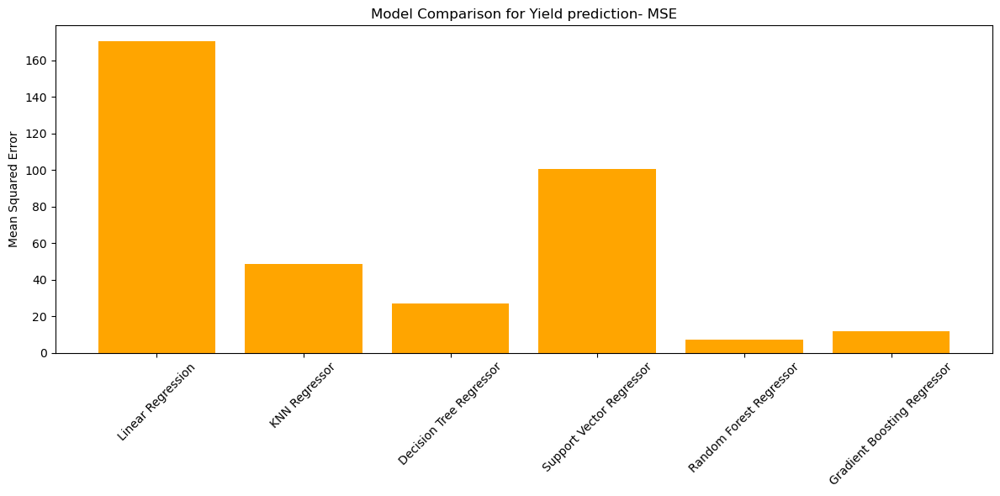

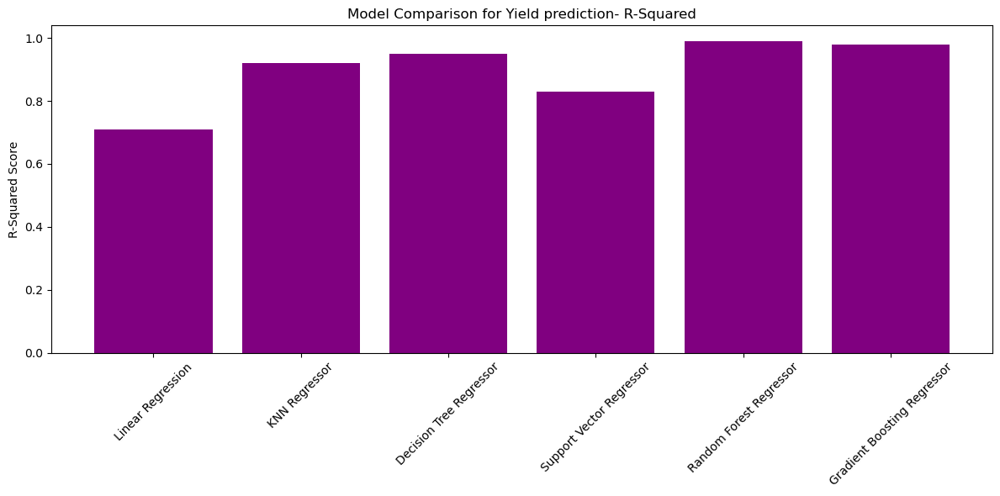

In [70]:
import pandas as pd
import matplotlib.pyplot as plt

# Example precomputed performance metrics
# Replace these with your actual scores
model_names = [
    'Linear Regression',
    'KNN Regressor',
    'Decision Tree Regressor',
    'Support Vector Regressor',
    'Random Forest Regressor',
    'Gradient Boosting Regressor'
]

# Precomputed MSE and R-Squared scores
mse_scores = [170.42, 48.35, 27.15, 100.57, 7.13, 11.73]  # Replace with your actual MSE values
r2_scores = [0.71, 0.92, 0.95, 0.83, 0.99, 0.98]   # Replace with your actual R² values

# Create a DataFrame to hold the performance data
performance_df = pd.DataFrame({
    'Model': model_names,
    'MSE': mse_scores,
    'R-Squared': r2_scores
})

# Display the performance comparison
print(performance_df)

# Plot the results

# Bar chart for MSE comparison
plt.figure(figsize=(12, 6))
plt.bar(performance_df['Model'], performance_df['MSE'], color='orange')
plt.title('Model Comparison for Yield prediction- MSE')
plt.ylabel('Mean Squared Error')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Bar chart for R-Squared comparison
plt.figure(figsize=(12, 6))
plt.bar(performance_df['Model'], performance_df['R-Squared'], color='purple')
plt.title('Model Comparison for Yield prediction- R-Squared')
plt.ylabel('R-Squared Score')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()